# seismic data in Python

I have tested two ways to work with SEG-Y data:

* [ObsPy](https://github.com/obspy/obspy/wiki): big, very complete and very complex;
* [Segpy](https://github.com/sixty-north/segpy), a fork of an old library called [SegyPy](http://segymat.sourceforge.net/segypy/) (note the additional *y*); smaller & simpler. This is the library I will be using and demonstrating here. Only works with Python 3; install with `pip install segpy`.

### loading SEG-Ys  with Segpy

Let's load a 2D line from the [USGS Alaska land dataset](http://energy.usgs.gov/GeochemistryGeophysics/SeismicDataProcessingInterpretation/NPRASeismicDataArchive.aspx).

First the usual libraries:

In [174]:
import numpy as np
# import segypy
import matplotlib.pyplot as plt

%matplotlib inline
# comment out the following if you're not on a Mac with HiDPI display
%config InlineBackend.figure_format = 'retina'

Now I will load the SEG-Y file and interrogate the header to get a few basic information (number of traces, samples, sample rate) so that I can build a Numpy array to store the actual seismic:

In [175]:
filename='16_81_PT1_PR.SGY'
f=open(filename, 'rb')
segy = create_reader(f)
ntraces  = segy.num_traces()
nsamples = segy.max_num_trace_samples()
sr       = segy.trace_header(0).sample_interval
dim      = segy.dimensionality

This is the actual loop where I load the seismic trace by trace and store it into the Numpy array `data`:

In [176]:
import datetime

t0 = datetime.datetime.now()

line = np.zeros((nsamples,ntraces))
for i in segy.trace_indexes():
    line[:,i] = segy.trace_samples(i)    

t1 = datetime.datetime.now()
elapsed_time = (t1 - t0).total_seconds()

print('Time to read the data: {} s'.format(elapsed_time))

Time to read the data: 17.705832 s


A brief summary of what I've done:

In [177]:
clip     = abs(np.percentile(data, 0.999))

print('number of traces: {0}, samples: {1}, sample rate: {2}, dimensions: {3}'.format(ntraces, nsamples, sr, dim))
print('trace length (ms): {0}'.format(sr/1e3 * nsamples))
print('value to clip data display: {:.1f}'.format(clip))
print('size in Mb of imported seismic: {0}'.format(data.nbytes/1024**2))

number of traces: 1912, samples: 1501, sample rate: 4000, dimensions: 0
trace length (ms): 6004.0
value to clip data display: 1667.9
size in Mb of imported seismic: 21.89569091796875


The following is a convenient function to interrogate any SEG-Y file (modified from the original function in the Segpy repo):

In [178]:
def report_segy(filename):
    with open(filename, 'rb') as infile:

        segy = create_reader(infile)
        print()
        print("Filename:             ", segy.filename)
        print("SEG Y revision:       ", segy.revision)
        print("Number of traces:     ", segy.num_traces())
        print("Number of samples:    ", segy.max_num_trace_samples())
        print("Sample interval:      ", segy.trace_header(0).sample_interval)
        print("Lag time (A):         ", segy.trace_header(0).lag_time_a)
        print("Lag time (B):         ", segy.trace_header(0).lag_time_b)        
        print("Data format:          ", segy.data_sample_format_description)
        print("Dimensionality:       ", segy.dimensionality)
        try:
            print("Number of CDPs:       ", segy.num_cdps())
        except AttributeError:
            pass
        try:
            print("Number of inlines:    ", segy.num_inlines())
            print("Number of crosslines: ", segy.num_xlines())
        except AttributeError:
            pass
        print("=== BEGIN TEXTUAL REEL HEADER ===")
        for line in segy.textual_reel_header:
            print(line[3:])
        print("=== END TEXTUAL REEL HEADER ===")
        print()
        print("=== BEGIN EXTENDED TEXTUAL HEADER ===")
        print(segy.extended_textual_header)
        print("=== END EXTENDED TEXTUAL_HEADER ===")

In [179]:
report_segy(filename)


Filename:              16_81_PT1_PR.SGY
SEG Y revision:        0
Number of traces:      1912
Number of samples:     1501
Sample interval:       4000
Lag time (A):          0
Lag time (B):          0
Data format:           IBM float
Dimensionality:        0
=== BEGIN TEXTUAL REEL HEADER ===
 CLIENT/JOB ID    1 8 1 4 2 6 8 3                                            
 LINE    16X                                                                 
 REEL NO 810604181418   DAY-START OF REEL  04       YEAR 1981                
 INSTRUMENT: MFG TI          MODEL ASC                                       
 DATA TRACES/RECORD0001      AUXILIARY TRACES/RECORD 0       CDP FOLD  0001  
 SAMPLE RATE   0000004000 US  SAMPLES/TRACE  1501BITS/IN 1600 BYTES/SAMPLE 4 
 RECORDING FORMAT  STDI              FORMAT THIS REEL SEG Y1                 
 SAMPLE CODE: FLOATING PT 4 BYTE                                             
 GAIN TYPE:   FLOATING PT                                                    
      

## show the seismic

To plot the entire line:

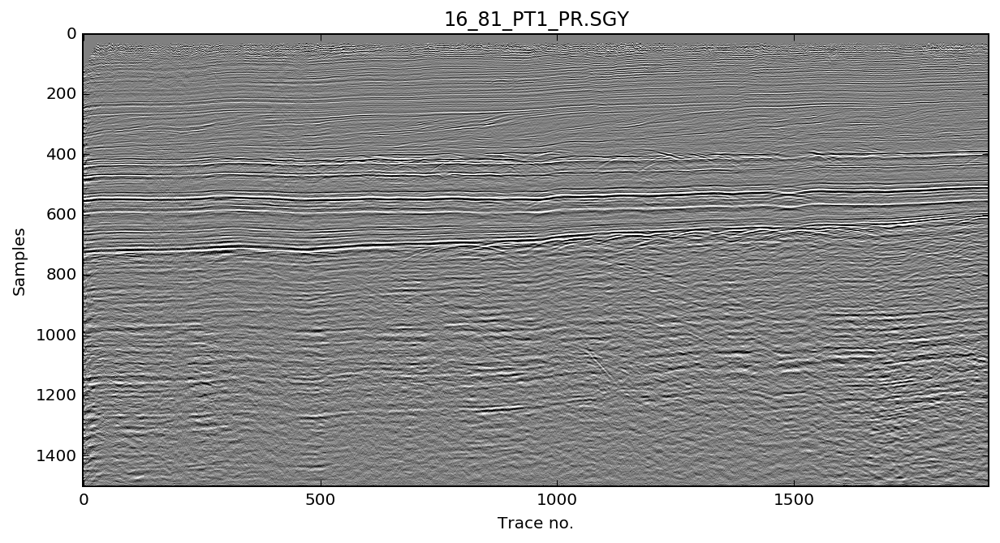

In [180]:
plt.figure(figsize=(10,5))
plt.imshow(data,interpolation='bilinear',aspect='auto',vmin=-clip,vmax=clip,cmap='gray')
plt.title('{0}'.format(filename))
plt.ylabel('Samples')
plt.xlabel('Trace no.')

This is a simple function to plot a seismic line:

In [181]:
def plot_seismic(inputseis,twt,name,colr=None,clip_val=None):
    ntraces=np.shape(inputseis)[1]
    if clip_val is None:
        clip_val=abs(np.percentile(inputseis, 0.999))   # default clip value
    if colr is None:
        colr='seismic'
    f, ax = plt.subplots(figsize=(16,6))
    im=ax.imshow(inputseis,interpolation='bilinear',aspect='auto',cmap=colr,extent=(0,ntraces,twt[-1],twt[0]),vmin=-clip_val,vmax=clip_val)
    plt.xlabel('Trace no.'), plt.ylabel('Two-way time [ms]')
    plt.title(name), plt.grid(), plt.colorbar(im)

To use it, first I have to create a two-way-time scale using the information previously read in the SEG-Y file itself (lag time, sample rate, number of samples):

In [182]:
lagtime=0
twt=np.arange(lagtime,sr/1e3*nsamples+lagtime,sr/1e3)

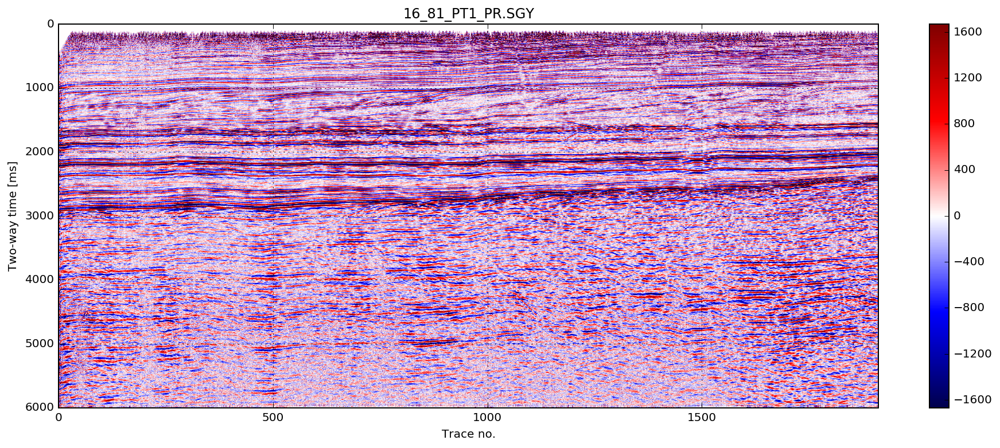

In [183]:
plot_seismic(line,twt,filename)

Another example, this time with a gray colorbar:

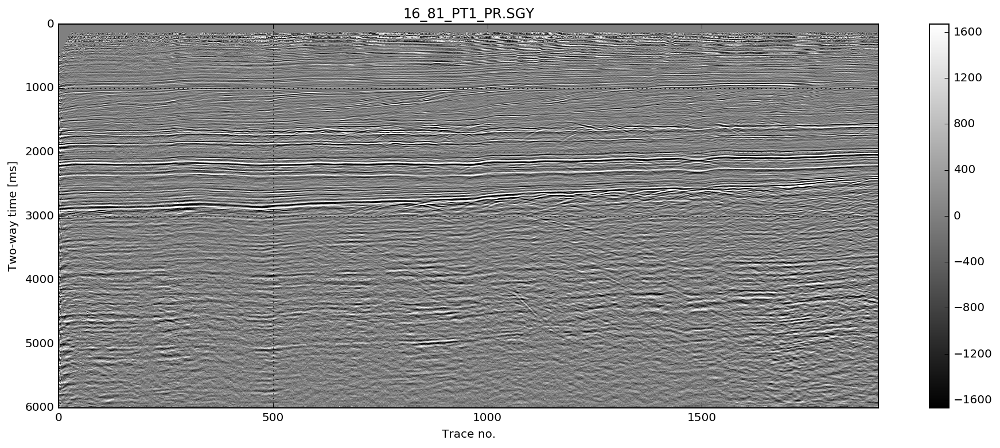

In [184]:
plot_seismic(line,twt,filename,colr='gray')

This is a way to zoom in, for example in the window from 1 to 2 seconds:

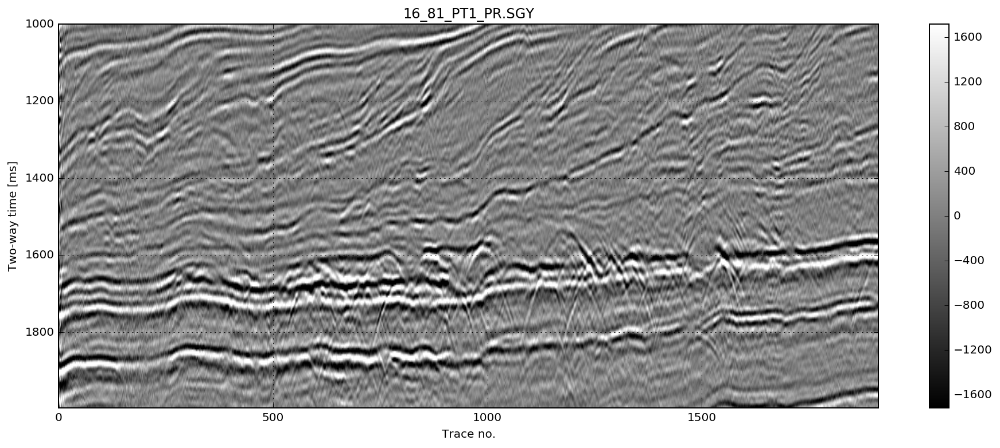

In [185]:
uu=1000; ll=2000

line_zoom=line[twt.tolist().index(uu):twt.tolist().index(ll),:]
twt_zoom=twt[twt.tolist().index(uu):twt.tolist().index(ll)]
plot_seismic(line_zoom,twt_zoom,filename,colr='gray')

As you can see, in the `plot_seismic` function you can also choose your preferred colormaps (it defaults to the classic red-blue seismic map). The default is the classical red-white-blue (`seismic`), other nice colormaps are `coolwarm`, `RdGy` (and don't forget to read these  essays on colormaps by [Matteo](http://nbviewer.ipython.org/github/mycarta/tutorials/blob/master/1408_Evaluate_and_compare_colormaps/How_to_evaluate_and_compare_colormaps.ipynb) and [Jake]( https://jakevdp.github.io/blog/2014/10/16/how-bad-is-your-colormap/
)).

All the colormaps available in [matplotlib](http://matplotlib.org/) are listed here:

* http://matplotlib.org/examples/color/colormaps_reference.html
* http://wiki.scipy.org/Cookbook/Matplotlib/Show_colormaps 

## comparison displays

Let's assume we want to build a comparison display to see two (or more) lines at once. I was thinking a classical near-far stack display but since I just have full stacks in this Alaska dataset I need to create other versions of the same line.

So for now I will just play a bit a create one version with noise added and another one with a smoothing filter applied (code for adding noise and smoothing the data taken straight from [this notebook by Matt Hall](http://nbviewer.ipython.org/github/agile-geoscience/notebooks/blob/master/Filtering_horizons.ipynb):

In [186]:
noise = np.random.uniform(-500,500, line_zoom.shape)
line_noise = line_zoom + noise

import scipy.signal
kernel = np.ones((5,5)) / 25
line_filt = scipy.signal.convolve2d(line_zoom, kernel)

Let's see them all:

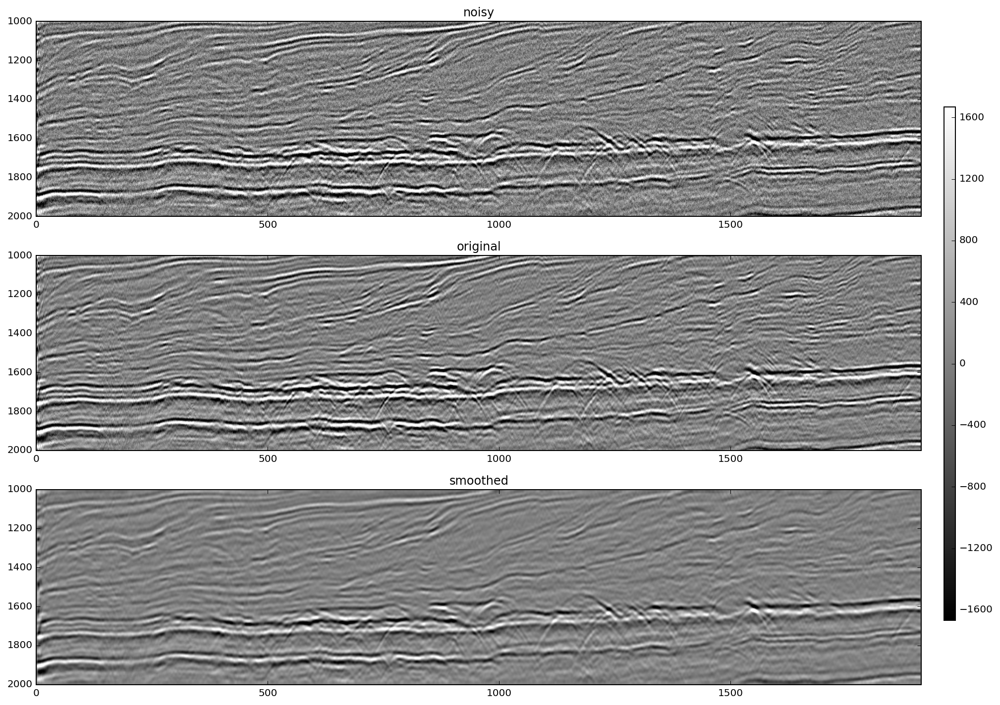

In [187]:
f, ax = plt.subplots(nrows=3,ncols=1,figsize=(16,12),facecolor='w')
im0=ax[0].imshow(line_noise,interpolation='bilinear',aspect='auto',cmap='gray',extent=(0,ntraces,ll,uu),vmin=-clip,vmax=clip)
im1=ax[1].imshow(line_zoom, interpolation='bilinear',aspect='auto',cmap='gray',extent=(0,ntraces,ll,uu),vmin=-clip,vmax=clip)
im2=ax[2].imshow(line_filt, interpolation='bilinear',aspect='auto',cmap='gray',extent=(0,ntraces,ll,uu),vmin=-clip,vmax=clip)
ax[0].set_title('noisy'), ax[1].set_title('original'), ax[2].set_title('smoothed')
cax = f.add_axes([0.92, 0.2, 0.01, 0.6])
f.colorbar(im0, cax=cax, orientation='vertical')

## reading 3D datasets

In [188]:
file_near = '3d_nearstack.sgy'

f=open(file_near, 'rb')
segy = create_reader(f)

ntraces  = segy.num_traces()
nsamples = segy.max_num_trace_samples()
sr       = segy.trace_header(0).sample_interval

t0 = datetime.datetime.now()

temp = np.zeros((nsamples,ntraces))
for i in segy.trace_indexes():
    temp[:,i] = segy.trace_samples(i)    

t1 = datetime.datetime.now()
elapsed_time = (t1 - t0).total_seconds()

print('Time to read the data: {} s'.format(elapsed_time))

Time to read the data: 41.598475 s


The information I have on these two cubes are:

* inline: 1300-1500, every 2
* xline: 1500-2000, every 2
* time: 1500-2500 ms
* total 25351 traces for each subcube.

Therefore I need to create an inline and a crossline vector and reshape the data:

In [189]:
inl=np.arange(1300,1502,2)
crl=np.arange(1500,2002,2)

seis = temp.reshape(nsamples,inl.size,crl.size)

The Numpy array `seis` has now this shape:

In [190]:
print(seis.shape)

(250, 101, 251)


The first dimension is time, the second is inlines and then crosslines:

* 250 twt samples x 101 inlines x 251 crosslines

The two-way-time vertical scale needs now to take into account the fact that the first sample is not at time 0 but 1.5 seconds. There is a lag time which should be reported on the SEG-Y headers:

In [191]:
lagtime = segy.trace_header(0).lag_time_a * -1
print(lagtime)

1500


(yes, I have multiplied the lag time by -1 because it's usually indicated as a negative number)

In [192]:
twt=np.arange(lagtime,sr/1e3*nsamples+lagtime,sr/1e3)
print('First sample: {} ms, last sample: {} ms'.format(twt.min(), twt.max()))

First sample: 1500.0 ms, last sample: 2496.0 ms


This is the way to plot a single line from the 3D and use the `plot_seismic` function defined above:

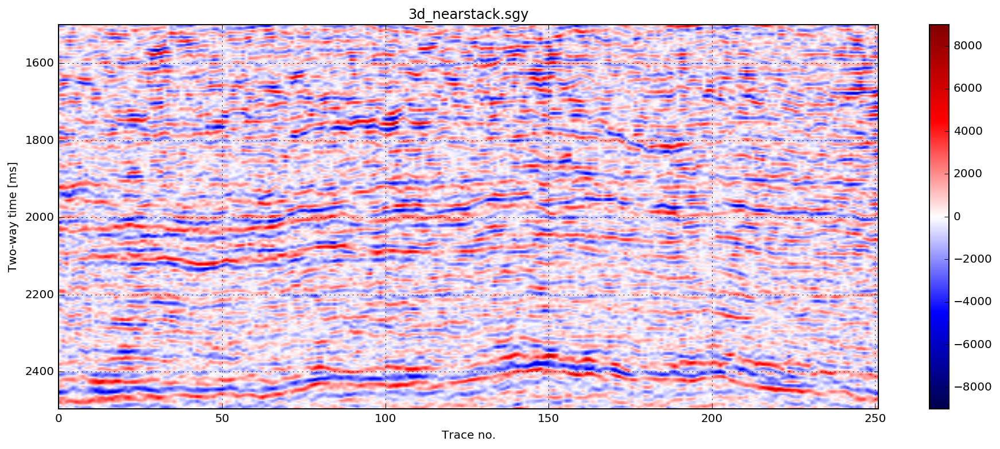

In [193]:
inline=1376
ii_idx=inl.tolist().index(inline)

plot_seismic(seis[:,ii_idx,:],twt,file_near,clip_val=9000)

## to-do

* add ObsPy method
* compute and display amplitude spectra